Initializing System

In [0]:
!apt-get install openjdk-8-jdk-headless -qq > /dev/null

In [0]:
!tar xf "/content/drive/My Drive/BigDataAssignment3Files/spark-2.4.5-bin-hadoop2.7.tgz"
!pip install -q findspark

In [0]:
import os
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"
os.environ["SPARK_HOME"] = "/content/spark-2.4.5-bin-hadoop2.7"

In [0]:
import findspark
findspark.init()
from pyspark.sql import SparkSession
from pyspark.context import SparkContext
spark = SparkSession.builder.master("local[*]").getOrCreate()

Reading Preprocessed Dataset

In [0]:
preprocessed_data = spark.read.json("hdfs://udit_gupta_1/processed_data")

Extract Data for EDA

In [0]:
preprocessed_data.columns

In [0]:
#Get top 30 crime types in complaints
top30_crime_type = preprocessed_data.rdd \
.filter(lambda row : row['RECORD_TYPE'] == 'C') \
.map(lambda row : (row['OFNS_DESC'],1)) \
.reduceByKey(lambda key1, key2 : key1 + key2) \
.takeOrdered(30,lambda atuple: -atuple[1])

In [0]:
complaints_crime_list = [ele[0] for ele in top30_crime_type if ele[0] is not None]

In [0]:
#Get top 30 arrests crime types
top30_arrests_crime_type = preprocessed_data.rdd \
.filter(lambda row : row['RECORD_TYPE'] == 'A') \
.map(lambda row : (row['OFNS_DESC'],1)) \
.reduceByKey(lambda key1, key2 : key1 + key2) \
.takeOrdered(30,lambda atuple: -atuple[1])

In [0]:
arrests_crime_list = [ele[0] for ele in top30_arrests_crime_type if ele[0] is not None]

In [0]:
#Get top 30 location types for crime complaints
top30_crime_locations = preprocessed_data.rdd \
.filter(lambda row : row['RECORD_TYPE'] == 'C') \
.map(lambda row : (row['PREM_TYP_DESC'],1)) \
.reduceByKey(lambda key1, key2 : key1 + key2) \
.takeOrdered(30,lambda atuple: -atuple[1])

In [0]:
complaints_location_list = [ele[0] for ele in top30_crime_locations if ele[0] is not None]

Generic Imports

In [0]:
import pandas as pd
import plotly.express as px
from pyspark.sql.functions import unix_timestamp, from_unixtime
from pyspark.sql import functions as F
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap
import copy

%matplotlib inline 

##Spatial Analysis

In [0]:
#Filtering for Last 3 years of data on Spatial Analysis
arrests_pandas_df = preprocessed_data.filter(preprocessed_data['RECORD_TYPE'] == 'A').select("*",from_unixtime(unix_timestamp('ARREST_DATE', 'MM/dd/yyyy')).alias("CastedDate")).filter((F.year('CastedDate') > 2016)).toPandas()

In [0]:
arrests_pandas_df['Latitude'] = arrests_pandas_df['Latitude'].astype(float)
arrests_pandas_df['Longitude'] = arrests_pandas_df['Longitude'].astype(float)

Density of top 10 Crimes in NYC

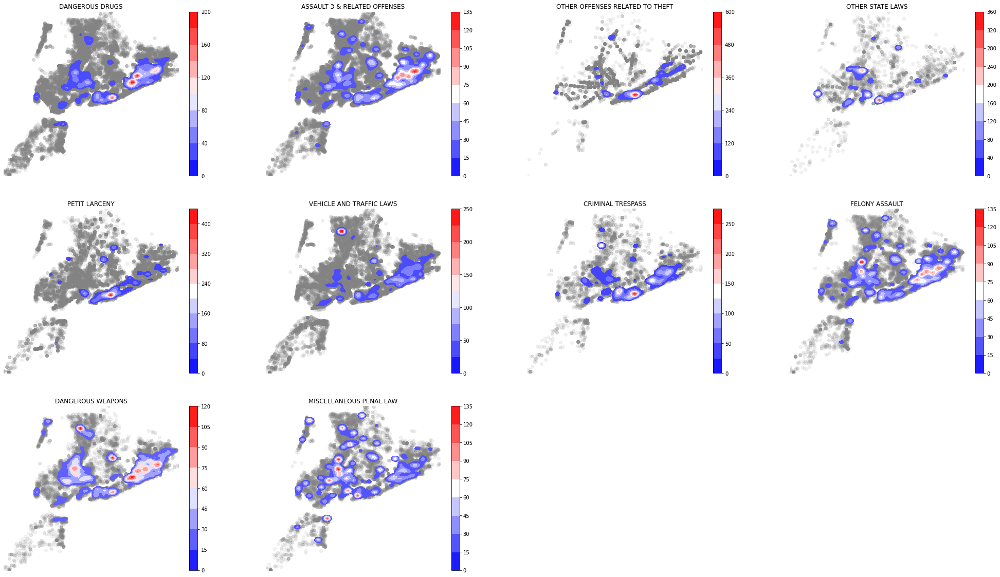

In [34]:
fig = plt.figure(figsize=(35,20))
for i, crime_type in enumerate(arrests_crime_list[0:10]):
    ax = fig.add_subplot(int(np.ceil(float(len(arrests_crime_list[0:10])) / 4)), 4, i+1)
    crimes_ = arrests_pandas_df[arrests_pandas_df['OFNS_DESC']==crime_type]

    #Plots a scatter plot style graph as a base map
    sns.regplot(crimes_['Latitude'], crimes_['Longitude'],
               fit_reg=False,
               scatter_kws={'alpha':.1, 'color':'grey'},
               ax = ax)
    
    #Plots a bivariate distribution on top of Previous Distribution
    sns.kdeplot(crimes_['Latitude'], crimes_['Longitude'],
                cmap="bwr", 
                bw=.005,
                #n_levels=10,
                cbar=True, 
                shade=True, 
                shade_lowest=False,
                ax = ax)
    ax.set_title(crime_type)
    ax.set_xlim(min(crimes_['Latitude']),max(crimes_['Latitude']))
    ax.set_ylim(min(crimes_['Longitude']),max(crimes_['Longitude']))
    ax.set_axis_off()    
plt.show()

Density Plot for Arrests of Different Ethnicity across NYC

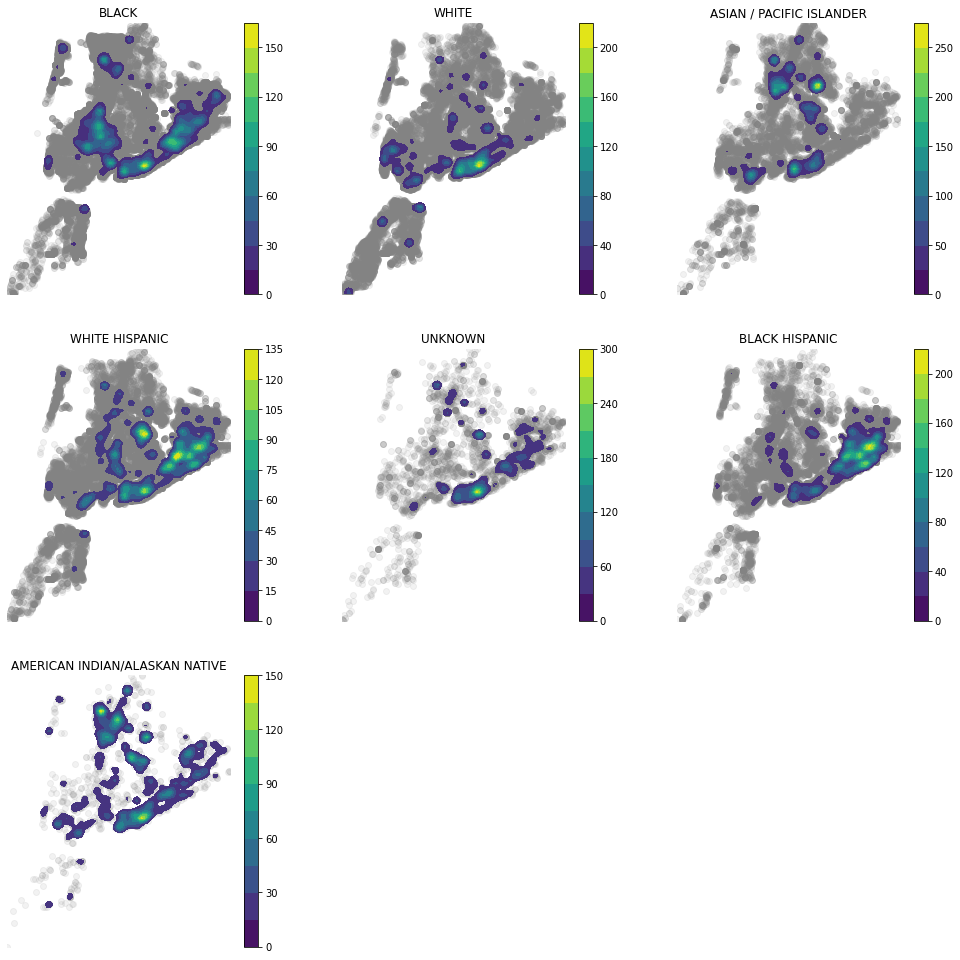

In [35]:
fig = plt.figure(figsize=(17,17))
for i, race_type in enumerate(arrests_pandas_df.SUSP_RACE.unique()):
    ax = fig.add_subplot(int(np.ceil(float(len(arrests_pandas_df.SUSP_RACE.unique())) / 3)), 3, i+1)
    race_ = arrests_pandas_df[arrests_pandas_df.SUSP_RACE == race_type]

    #Plots a scatter plot style graph as a base map
    sns.regplot(race_['Latitude'], race_['Longitude'],
               fit_reg=False,
               scatter_kws={'alpha':.1, 'color':'grey'},
               ax = ax)
    
    #Plots a bivariate distribution on top of Previous Distribution
    sns.kdeplot(race_['Latitude'], race_['Longitude'],
                cmap="viridis", 
                bw=.005,
                #n_levels=10,
                cbar=True, 
                shade=True, 
                shade_lowest=False,
                ax = ax)
    ax.set_title(race_type)
    ax.set_xlim(min(race_['Latitude']),max(race_['Latitude']))
    ax.set_ylim(min(race_['Longitude']),max(race_['Longitude']))
    ax.set_axis_off()    
plt.show()

###Heat Map for A Closer look at some Violent Crimes in NYC

Harrassment

In [36]:
# Harrassment crime map
crime_map = folium.Map(location=[40.93, -73.91], 
                       tiles = "Stamen Toner",
                      zoom_start = 10)
data_heatmap = []
# Add data for heatmap 
for index, row in arrests_pandas_df[arrests_pandas_df['OFNS_DESC'] == 'HARRASSMENT 2'].iterrows():
  if(row['Latitude'] is None or row['Longitude'] is None):
        continue
  data_heatmap.append([float(row['Latitude']), float(row['Longitude'])])

HeatMap(data_heatmap, radius=10).add_to(crime_map)
crime_map

Assault

In [42]:
# Harrassment crime map
crime_map = folium.Map(location=[40.93, -73.91], 
                       tiles = "Stamen Toner",
                      zoom_start = 10)
data_heatmap = []
# Add data for heatmap 
for index, row in arrests_pandas_df[arrests_pandas_df['OFNS_DESC'] == 'ASSAULT 3 & RELATED OFFENSES'].iterrows():
  if(row['Latitude'] is None or row['Longitude'] is None):
        continue
  data_heatmap.append([float(row['Latitude']), float(row['Longitude'])])

HeatMap(data_heatmap, radius=10).add_to(crime_map)
crime_map

Dangerous Drugs

In [43]:
# Harrassment crime map
crime_map = folium.Map(location=[40.7, -73.91], 
                       tiles = "Stamen Toner",
                      zoom_start = 10)
data_heatmap = []
# Add data for heatmap 
for index, row in arrests_pandas_df[arrests_pandas_df['OFNS_DESC'] == 'DANGEROUS DRUGS'].iterrows():
  if(row['Latitude'] is None or row['Longitude'] is None):
        continue
  data_heatmap.append([float(row['Latitude']), float(row['Longitude'])])

HeatMap(data_heatmap, radius=10).add_to(crime_map)
crime_map

Stratified Sampling for Large Data

In [0]:
# Stratified Sampling
race_fraction = {
    "WHITE":0.01,
    "BLACK":0.01,
    "BLACK HISPANIC":0.01,
    "WHITE HISPANIC":0.01,
    "UNKNOWN":0,
    "OTHER":0,
    "AMERICAN INDIAN/ALASKAN NATIVE":0.01,
    "ASIAN / PACIFIC ISLANDER":0.01
} 

sampled_data = preprocessed_data \
.filter(preprocessed_data['RECORD_TYPE'] == 'A') \
.sampleBy("SUSP_RACE", fractions=race_fraction, seed=0).toPandas()

sampled_data = sampled_data[["Latitude", "Longitude", "SUSP_RACE"]]\
                .astype({'Latitude': 'double', 'Longitude': 'double'})

Ethinicity Distribution of Arrests across NYC

In [47]:
map_box_token = "_Security_Key_Here_"
px.set_mapbox_access_token(map_box_token)
df = px.data.carshare()
fig = px.scatter_mapbox(sampled_data, lat="Latitude", lon="Longitude", color="SUSP_RACE",
                  color_continuous_scale=px.colors.cyclical.IceFire, zoom=11 ,width=1200, height=768)
fig.show()